# Wind Power Prediction

In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
from google.colab import drive
import numpy as np
import matplotlib
import seaborn as sns
import numpy as np
import logging
import torch
import sys

BASE = '/content/drive'
drive.mount(BASE)

sns.set(style="whitegrid")
matplotlib.rc("lines", linewidth=2)
matplotlib.rc("figure", figsize=(16,6))

Mounted at /content/drive


## Setup

In [2]:
def get_device():
    if torch.cuda.is_available():
        device = torch.device("cuda")
    else:
        device = torch.device("cpu")
    logging.info("Running on device %s", device)
    return device

get_device()

device(type='cuda')

In [ ]:
!ls

drive  sample_data


In [ ]:
path = BASE + "/MyDrive"
sys.path.append(path)
import linear_v1 as linear_v1_model

### Task

Concretely, the task is to create a model which accepts as input weather feature data of shape $[C, 24, 14, 14]$ (where $c$ is number of weather features considered) and outputs a 24 hour forecast for the wind power production at each wind farm in the dataset, which will be of shape $[24, 237]$.

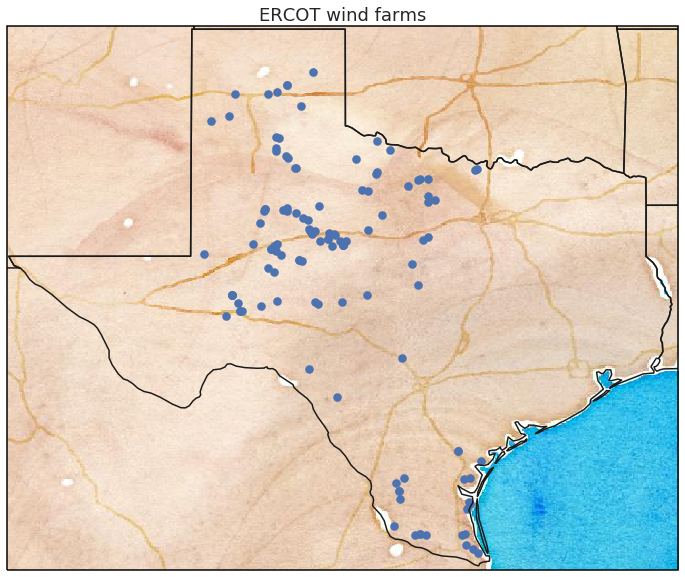

### Dataset

The data is stored in this folder as `dfs`, a dictionary of pandas DataFrames. There are three key-value pairs in `dfs` the data, described below.

####  ERCOT wind power production (targets)
This is the data we are aiming to learn to forecast. The dataset includes farm level power output for 2015-2020 at hourly intervals. Wind farms that came online after the dataset's start date of 2015-01-01 will have only partial data - prior to their start date, they will have NaNs. In the provided dataset, we include a mask to apply to the predictions which will mask out predictions made for farms during their non-operational periods so that those data don't affect the loss.

Additionally, wind farms occasionally need to curtail (cut or reduce) the amount of power they are supplying to the grid when certain events cause energy prices to go negative at the node the wind farm injects power into. Those periods have also been masked, since our goal is to predict what the wind farms would produce assuming no curtailment is necessary.

Below is a sample of one week's worth of energy production for 5 farms in the dataset.

Text(0, 0.5, 'Wind power production (MWh)')

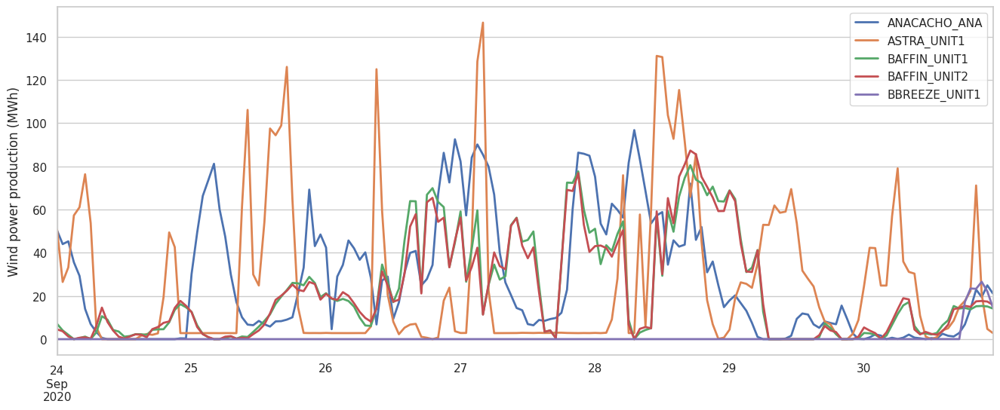

In [ ]:
dpath = BASE + "/MyDrive/dfs14.pkl"
# dpath = path + "/dfs14.pkl"
dfs = linear_v1_model.read_pickle(dpath)
ercot_wind_power = dfs["y"]
ercot_wind_power.iloc[-24*7:,:5].plot()
plt.ylabel("Wind power production (MWh)")

# Solution

## Dataset preprocessing

The get_dataset function below is used to perform specific operations on the dataset before using it for training. The following are the types of dataset variations returned after performing specific operations:-


*   vanilla : When this parameter is set to true, the original dataset is returned without any changes.
*   rolling_average: When this parameter is set to true, a rolling average is calculated over the entire dataset at window sizes of 24 for all the three different channels and the values are concatenated as new channels. Also, as the window size is 24, the first 23 data points are omitted as they will have Nan as their value. The new dataset shape during training is (32, 24, 14, 14, 6).
*    pca: When this parameter is set to true, pca is applied over all the 588 feature columns and are reduced to the set pca_components value which is 50 by default. The new dataset shape will be (20000, pca_components).
*   rolling_average_pca: When this parameter is set to true, first rolling_average operations are performed to increase the number of channels from 3 to 6 and then pca is applied on the new dataset that we obtain after rolling averahe has been applied. The final dataset shape will be (20000, pca_components)




In [ ]:
from sklearn.decomposition import PCA

def get_dataset(vanilla = True, pca = False, rolling_average = False, rolling_average_pca = False, pca_components = 50):
  dfs = read_pickle(dpath)
  if vanilla:
    return dfs
  elif rolling_average:
    window_size = 24
    data = np.asarray(dfs['X'])
    data_reshaped = data
    data = data.reshape((dfs['X'].shape[0],14,14,3))
    df = pd.DataFrame(data_reshaped)
    rolling_means = df.rolling(window=window_size, axis = 0).mean()
    rolling_means = rolling_means.dropna()
    rolling_mean_reshaped = rolling_means.values.reshape(-1, 14, 14, 3)
    augmented_data = np.concatenate((data[23:], rolling_mean_reshaped), axis=3)
    augmented_data = augmented_data.reshape(-1, 14*14*6)
    datetime_index = pd.date_range(start='2018-06-21 15:00:00-05:00', periods=19977, freq='H')

    if rolling_average_pca:
      pca = PCA(n_components=pca_components)  # Number of components to keep
      pca_transformed_data = pca.fit_transform(augmented_data)
      dfs['X'] = pd.DataFrame(pca_transformed_data, index = datetime_index)
      dfs['y'] = dfs['y'][23:]
      dfs['w'] = dfs['w'][23:]
      return dfs

    else:
      dfs['X'] = pd.DataFrame(augmented_data, index = datetime_index)
      dfs['y'] = dfs['y'][23:]
      dfs['w'] = dfs['w'][23:]
      return dfs
  else:

    pca = PCA(n_components=pca_components)  # Number of components to keep
    data = dfs['X']
    pca_transformed_data = pca.fit_transform(data)
    datetime_index = pd.date_range(start='2018-06-20 16:00:00-05:00', periods=len(pca_transformed_data), freq='H')
    dfs['X'] = pd.DataFrame(pca_transformed_data, index=datetime_index)
    return dfs


## Data visualization

Two different plots are used here to visualize a subset (first 1000 hours) of the dataset. The heatmap plot is used to visualize the sea level pressure and the quiver plot is used to visualize the wind speed. Both these plots are combined together and the result is saved as "visualization.gif". A single frame from the gif is displayed below.

In [ ]:
sampleData = dfs['X'].iloc[0:1000,:]
sampleData = np.asarray(sampleData)
print("init shape",sampleData.shape)
sampleData = np.reshape(sampleData,(1000,14,14,3))
sampleData.shape
print("final shape",sampleData.shape)


init shape (1000, 588)
final shape (1000, 14, 14, 3)


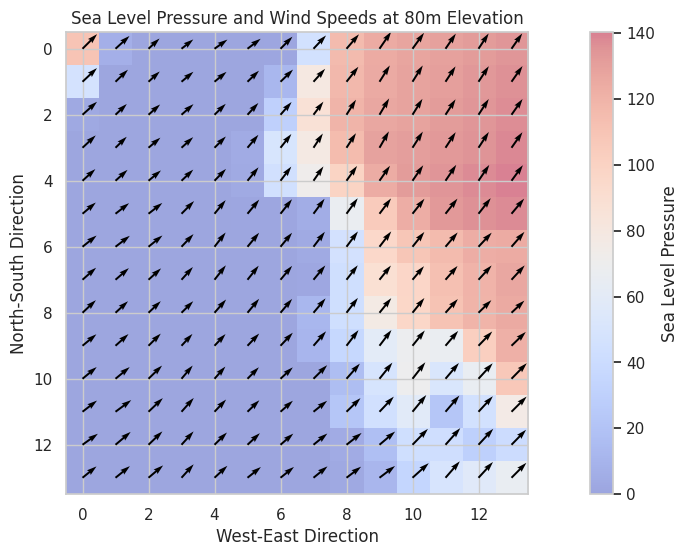

In [ ]:
sea_level_pressure = sampleData[0,:,:,0]
u_wind = sampleData[0,:,:,1]
v_wind = sampleData[0,:,:,2]

Y, X = np.mgrid[0:14, 0:14]

# Creating the heatmap for sea level pressure
plt.imshow(sea_level_pressure, cmap='coolwarm', alpha=0.5)
plt.colorbar(label='Sea Level Pressure')

# Creating the quiver plot for wind speeds
plt.quiver(X, Y, u_wind, v_wind, color='black')

plt.title("Sea Level Pressure and Wind Speeds at 80m Elevation")
plt.xlabel("West-East Direction")
plt.ylabel("North-South Direction")
plt.show()

In [ ]:
from matplotlib.animation import FuncAnimation
# Initialize plot
fig, ax = plt.subplots()
Y, X = np.mgrid[0:14, 0:14]
pressure_map = ax.imshow(sampleData[0, :, :, 0], cmap='coolwarm', alpha=0.5)
quiver = ax.quiver(X, Y, sampleData[0, :, :, 1], sampleData[0, :, :, 2])
cb = fig.colorbar(pressure_map, ax=ax, orientation='vertical')
cb.set_label('Sea Level Pressure')
ax.set_title('Hour 0')

# Update function for animation
def update(hour):
    pressure_map.set_data(sampleData[hour, :, :, 0])
    quiver.set_UVC(sampleData[hour, :, :, 1], sampleData[hour, :, :, 2])
    ax.set_title(f'Hour {hour}')

# Create animation
anim = FuncAnimation(fig, update, frames=1000, interval=10)
anim.save("sample.gif")
plt.show()


## NAM numerical weather prediction model (features)

This is the feature data we will use to make our predictions.

NOAA publishes several numerical weather prediction (NWP) models on a daily basis. Here we collect data from the [North American Mesocale (NAM) model](https://www.ncdc.noaa.gov/data-access/model-data/model-datasets/north-american-mesoscale-forecast-system-nam) for a grid that covers Texas and surrounding area.

The forecast for a single day is of shape $[24, 14, 14, 3]$, or $[T, H, W, C]$ for time, height, width, and number of features (channels). Note that we have given the data to you in shape $[n_{days}*24, H*W*C]$, but you can easily reshape it to the original dimensions, should you choose.

The features provided in the weather data are:
- `sea_level_pressure`: pressure at sea level
- `u_wind_80m`: West-East wind speed at 80 meters of elevation
- `v_wind_80m`: North-South wind speed at 80 meters of elevation

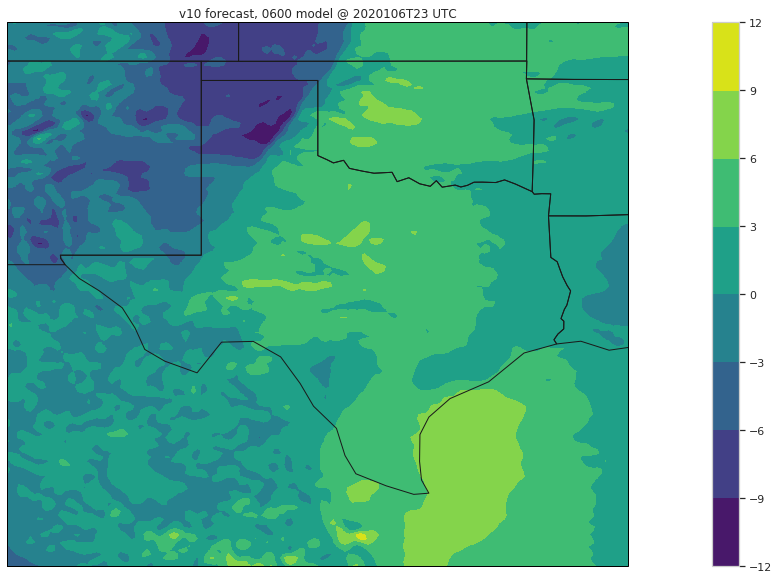

### Target mask

This is real world data. That unfailiingly means it's messy, incomplete, and requires some coaxing to perform well. There are a variety of reasons we mask the data so it doesn't contribute to the loss function, but *we don't expect you to look at or change the target mask*. Just use it in the same way it's used in `linear_v1.py`.

For convenience, here are the current shapes of data in `dfs`:

In [ ]:
_ = [print(k, v.shape) for k, v in dfs.items()]

X (20000, 588)
y (20000, 237)
w (20000, 237)


## Baseline: linear model

The file `linear_v1.py` provides a simple baseline model along with all the code necessary to read in the provided dataset, process it, and train. The script can be run with default args from the command line via `python linear_v1.py`.

Below are the ground truth and predictions for two wind farms, after the model trained for 100 epochs.

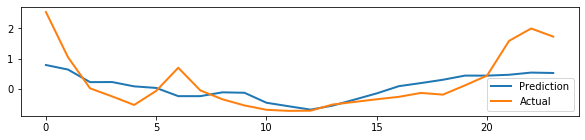

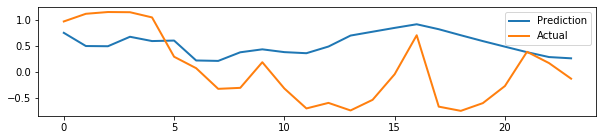

## Model architecture considerations

- We have spatiotemporal features. It seems natural to consider the spatial dimensions together, i.e. with things such as 2D convolutions, but when and how should the features be considered across the temporal dimension?
- Targets have fewer and smaller dimensions. How can we use the model architecture to map features to targets, while best using the feature information?
- The size of the feature data is quite large. What methods allow for efficiently increasing the size of the receptive field or downsizing the feature data without unnecessarily increasing the number of parameters?
- As a general approach, a good suggestion is to start with something that you are familiar and confident with as your own baseline, and then working on incremental improvements to that model.

In [ ]:
# You can launch tensorboard using this code
# %reload_ext tensorboard
# %tensorboard --logdir /content/drive/MyDrive/gridmatic/tensorboard/

## Generic training helpers

In [ ]:

from datetime import datetime
from sklearn import model_selection
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import argparse
import joblib
import numpy as np
import os
import torch
import torch.nn as nn
import tqdm
import pandas as pd
from sklearn.preprocessing import StandardScaler



#
# Helper functions not directly related to data
#


class AverageMetric(object):
    def __init__(self, scale=1.0):
        self.count = 0
        self.value = 0
        self.scale = scale

    def update(self, value, n):
        if n == 0:
            return
        self.value += n / (self.count + n) * (value * self.scale - self.value)
        self.count += n


def read_pickle(src):
    return joblib.load(src)


def write_pickle(model, dst):
    joblib.dump(model, dst)


def get_device():
    if torch.cuda.is_available():
        device = torch.device("cuda")
    else:
        device = torch.device("cpu")

    print("Running on device %s" % device)
    return device


def kfold_chunk(n, n_splits, chunk_size, random_state=None):
    """
    Divides data using sklearn's cv split
    """
    n_chunks = n / chunk_size
    if n % chunk_size:
        n_chunks += 1

    def _chunk(k):
        return range(k * chunk_size, min((k + 1) * chunk_size, n))

    kf = model_selection.KFold(
        n_splits=n_splits, shuffle=True, random_state=random_state
    )
    cv = []
    for t_chunk, s_chunk in kf.split(np.arange(n_chunks)):
        t = [i for k in t_chunk for i in _chunk(k)]
        s = [i for k in s_chunk for i in _chunk(k)]
        cv.append((t, s))
    return cv


def load_model(model_dir):
    checkpoint_file = os.path.join(model_dir, "checkpoint.pth.tar")
    assert os.path.exists(checkpoint_file), "No checkpoint found in %s" % model_dir

    params = read_pickle(os.path.join(model_dir, "params.pkl"))
    state_dict = torch.load(checkpoint_file)
    model = Model(**params["model"])
    model.load_state_dict(state_dict["model"])

    print("Previous training completed %i epochs" % state_dict["epoch"])
    return model, params


#
# Data preprocessing
#

NAM_SHIFT_M_A = np.array(
    [
        109.68943293843417,  # Pa
        128.74438657930364,  # m/s
        128.74438657930364,  # m/s
        109.68943293843417,  # Pa
        128.74438657930364,  # m/s
        128.74438657930364,  # m/s
    ],
    dtype=np.float32,
)

NAM_SCALE_M_A = np.array(
    [
        73.87423140863105,  # Pa
        17.35445118879509,  # m/s
        17.35445118879509,  # m/s
        109.68943293843417,  # Pa
        128.74438657930364,  # m/s
        128.74438657930364,  # m/s
    ],
    dtype=np.float32,
)

NAM_SHIFT = np.array(
    [
        109.68943293843417,  # Pa
        128.74438657930364,  # m/s
        128.74438657930364,  # m/s
    ],
    dtype=np.float32,
)

NAM_SCALE = np.array(
    [
        73.87423140863105,  # Pa
        17.35445118879509,  # m/s
        17.35445118879509,  # m/s
    ],
    dtype=np.float32,
)

WIND_POWER_SHIFT = np.array([29.906836194977963], dtype=np.float32)
WIND_POWER_SCALE = np.array([38.9876854204175], dtype=np.float32)


def get_data(dfs, params, spatial_dim_shape = (14,14,3), pca = False, pca_components = 50):
    """Reads in data subject to data parameters."""

    index = dfs["X"].index
    time_horizon = params["data"]["horizon"]
    if time_horizon > 24:
        raise RuntimeError("longer time_horizon changes the dataset split and corrupts the val set")

    output = {}
    for k, v in dfs.items():
        idx = np.nonzero(index[: -time_horizon + 1].hour == 0)[0]
        idx = idx.reshape(-1, 1) + np.arange(0, time_horizon)
        output[k] = v.values[idx]

    if pca:

      output["X"] = output["X"].reshape(
          *output["X"].shape[:2], pca_components
      )
    else:
      output["X"] = output["X"].reshape(
          *output["X"].shape[:2], *spatial_dim_shape
      )
    print("_" * 50)
    print("features:", output["X"].shape)
    print("targets:", output["y"].shape)
    print("weights:", output["w"].shape)
    print("_" * 50)

    # Scale targets
    output["y"] -= WIND_POWER_SHIFT
    output["y"] /= WIND_POWER_SCALE

    # NOTE: We defer scaling the X features until inside the training loop
    # because scaling them here would result in a type conversion from uint8 to
    # float32 and subsequent increase in memory usage

    print("Data read and preprocessed")

    return output


def split_data(data, params):
    """Pass data to split into train, val sets."""
    n = data["X"].shape[0]

    chunk_size = 2
    t, s = kfold_chunk(n, 5, chunk_size, random_state=0)[0]
    print("Train samples:", len(t))
    print("Val samples:", len(s))

    train_data, val_data = [], []
    for d in ["X", "y", "w"]:
        val_data.append(torch.from_numpy(data[d][s]))
        train_data.append(torch.from_numpy(data[d][t]))

    return train_data, val_data







def get_params():
    params = {
        "train_epochs": 1000,
        "optimizer": {"lr": 1e-5},
        "loader": {"batch_size": 32},
        "model": {
            "in_dim": 14 * 14 * 3,  # h * w * c, the dimensions of the features
            "out_dim": 237,  # the number of farms
        },
        "data": {
            "horizon": 24,  # n hours to predict
            "channels": 3,  # before preprocessing (add icing feats)
            "height": 14,  # height of the input
            "width": 14,  # width of the input
        },
    }
    return params


def train_model(train_data, model, model_dir, params, val_data=None):
    print("Training %s" % model_dir)
    device = get_device()
    model.to(device)

    optimizer = torch.optim.Adam(model.parameters(), **params["optimizer"])

    train_loader = DataLoader(
        torch.utils.data.TensorDataset(*train_data),
        **params["loader"],
        shuffle=True,
        pin_memory=True,
    )
    train_writer = SummaryWriter(model_dir + "/train")

    val_loader = None
    val_writer = None
    if val_data is not None:
        val_loader = DataLoader(
            torch.utils.data.TensorDataset(*val_data),
            **params["loader"],
            pin_memory=True,
        )
        val_writer = SummaryWriter(model_dir + "/eval")

    print(model)
    print(
        "Number of parameters: %i" % sum(np.prod(x.shape) for x in model.parameters())
    )
    write_pickle(params, model_dir + "/params.pkl")
    checkpoint_file = model_dir + "/checkpoint.pth.tar"

    if os.path.exists(checkpoint_file):
        state_dict = torch.load(checkpoint_file)
        start_epoch = state_dict["epoch"]
        model.load_state_dict(state_dict["model"])
        optimizer.load_state_dict(state_dict["optimizer"])
        print("Previous training completed %i epochs" % start_epoch)
    else:
        start_epoch = 0
    preds = None
    ytrue = None
    for epoch in range(start_epoch, params["train_epochs"]):
        train_one_epoch(
            train_loader,
            model,
            optimizer,
            epoch + 1,
            train_writer,
            device,
            leave=val_loader is None,
        )
        if val_loader is not None:
          if epoch + 1 == params["train_epochs"]:
            preds, ytrue = evaluate(
                val_loader,
                model,
                epoch + 1,
                val_writer,
                device,
                return_preds = True
            )
          else:
            evaluate(
                val_loader,
                model,
                epoch + 1,
                val_writer,
                device,
            )

        checkpoint = {
            "model": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "epoch": epoch + 1,
        }
        torch.save(checkpoint, checkpoint_file)

    write_pickle("", model_dir + "/DONE")

    return preds, ytrue
def train_one_epoch(
    loader,
    model,
    optimizer,
    epoch,
    writer,
    device,
    leave=False,
):
    model.train()
    metrics = model.metrics()
    gen = tqdm.tqdm(loader, leave=leave)
    for features, targets, weights in gen:
        features = features.to(device, non_blocking=True)
        targets = targets.to(device, non_blocking=True)
        weights = weights.to(device, non_blocking=True)

        optimizer.zero_grad()
        loss = model.loss(features, targets, weights, metrics=metrics)
        loss.backward()
        optimizer.step()

        gen.set_description(
            "Epoch %d, train loss: %.3f" % (epoch, metrics["loss"].value)
        )

    for k, metric in metrics.items():
        writer.add_scalar(k, metric.value, epoch)
    writer.flush()


def evaluate(loader, model, epoch, writer, device, leave=False, return_preds = False):
    model.eval()
    metrics = model.metrics()
    gen = tqdm.tqdm(loader, leave=leave)
    preds, ytrue = None, None
    with torch.no_grad():
        for features, targets, weights in gen:
            features = features.to(device, non_blocking=True)
            targets = targets.to(device, non_blocking=True)
            weights = weights.to(device, non_blocking=True)
            if return_preds:

              _, preds, ytrue = model.loss(features, targets, weights, metrics=metrics, return_preds = True)
            else:
              model.loss(features, targets, weights, metrics=metrics)


            gen.set_description(
                "Epoch %d, val loss: %.3f" % (epoch, metrics["loss"].value)
            )

    for k, metric in metrics.items():
        writer.add_scalar(k, metric.value, epoch)
    writer.flush()
    if return_preds:
      return preds, ytrue

def start_training(model, modeldirname, epochs = 1000, vanilla = False, pca = False, rolling_average = False, rolling_average_pca = False, pca_components = 50):
    # curr_dir = BASE + "MyDrive"
    curr_dir = path
    params = get_params()
    model_dir = os.path.join(path, "tensorboard", modeldirname, datetime.now().strftime("%Y%m%d%H%M%S"))
    if not os.path.exists(model_dir):
        os.makedirs(model_dir)
    print("Model dir: ", model_dir)
    data = get_dataset(vanilla, pca, rolling_average, rolling_average_pca, pca_components)
    if vanilla:
      data = get_data(data, params)
    elif pca or rolling_average_pca:
      data = get_data(data, params, pca = True, pca_components = pca_components)
    else:
      data = get_data(data, params, spatial_dim_shape = (14,14,6))

    print("data size", data['X'].shape)

    train_data, val_data = split_data(data, params)
    params['train_epochs'] = epochs
    preds, ytrue = train_model(train_data, model, model_dir, params, val_data=val_data)
    return model, preds, ytrue

## Targets v/s Preds plot

In [ ]:
def target_vs_preds_plot(ytrue, preds):
  x = np.arange(24)
  # Plot the target line
  plt.plot(x, ytrue[0,:,0].cpu(), label='Actual', color='blue', linestyle='-', marker='o')

  # Plot the prediction line
  plt.plot(x, preds[0,:,0].cpu(), label='Prediction', color='orange', linestyle='-', marker='x')

  plt.title('Actual vs Prediction')
  plt.xlabel('Index')
  plt.ylabel('Values')

  # Show legend
  plt.legend()

  # Display the plot
  plt.show()

## Linear approach

This is the original linear model from linear_v1.py. We apply it on all three different types of dataset variations we have (vanilla, pca, and rolling_average).

In [ ]:
class LinearModel(nn.Module):
    def __init__(self, in_dim, out_dim, rolling_average = False, pca = False):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_dim, out_dim)
        self.pca = pca

        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))
        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def preprocess_features(self, features):
        features = (features.float() - self.features_shift) / self.features_scale
        features = features.permute(0, 4, 1, 2, 3).contiguous()  # NTHWC --> NCTHW
        return features

    def forward(self, features):
         if not self.pca:


              features = self.preprocess_features(features)
              b,c,t, h, w = features.shape
              features = features.transpose(1, 2)  # b, t, c, h, w
              # Collapse all feature dims except time
              features = features.reshape(b, t, -1)  # b, t, c*h*w
              return self.linear(features)  # b, t, n
         else:
              b,t,f = features.shape
              features = features.reshape(b, t, -1)
              return self.linear(features.float())  # b, t, n



    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()  # n included samples
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse




#### Vanilla data

In [ ]:
linear_model_vanilla = LinearModel(14*14*3, 237)
trained_model,preds, ytrue = start_training(linear_model_vanilla, 'linear_NN',500, vanilla = True)

Model dir:  /content/drive/MyDrive/tensorboard/linear_NN/20231201225539
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/linear_NN/20231201225539
Running on device cuda
LinearModel(
  (linear): Linear(in_features=588, out_features=237, bias=True)
)
Number of parameters: 139593


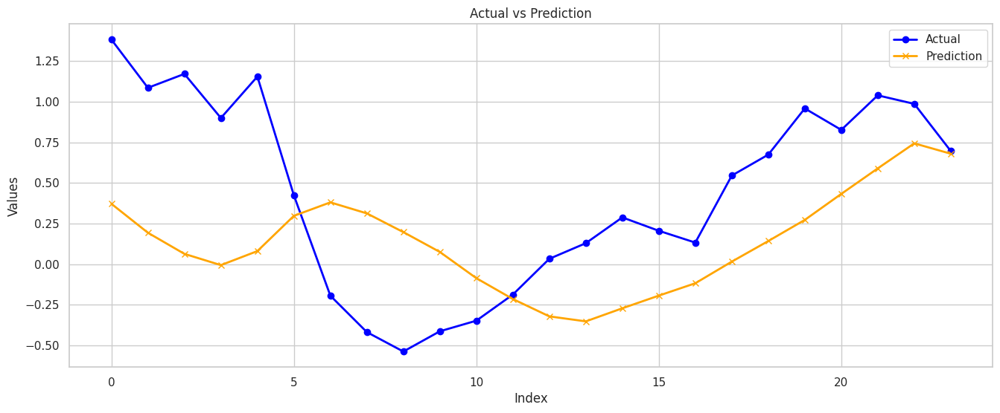

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling average data

In [ ]:
linear_model_ma = LinearModel(14*14*6, 237, rolling_average = True)
trained_model,preds, ytrue = start_training(linear_model_ma, 'linear_NN_MA',500, rolling_average = True)

Model dir:  /content/drive/MyDrive/tensorboard/linear_NN_MA/20231201225737
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/tensorboard/linear_NN_MA/20231201225737
Running on device cuda
LinearModel(
  (linear): Linear(in_features=1176, out_features=237, bias=True)
)
Number of parameters: 278949


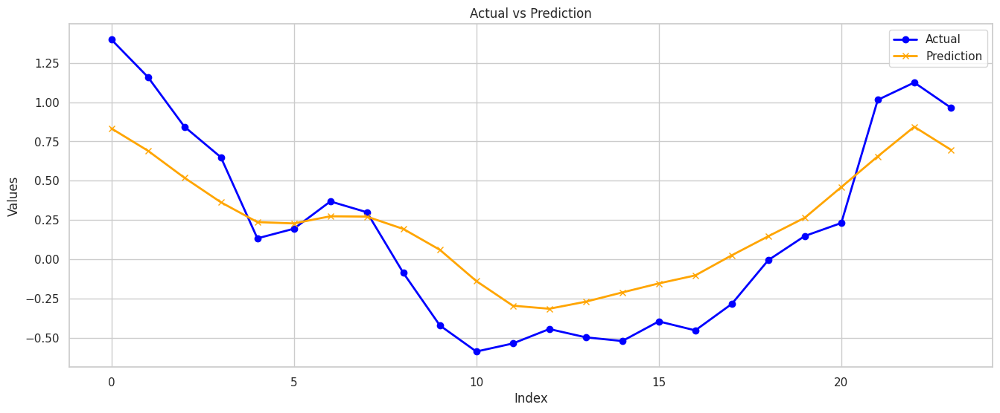

In [ ]:
target_vs_preds_plot(ytrue, preds)

### PCA data

In [ ]:
linear_model_pca = LinearModel(256, 237, pca = True)
trained_model,preds, ytrue = start_training(linear_model_pca, 'linear_NN_pca',500, pca = True, pca_components = 256)

Model dir:  /content/drive/MyDrive/tensorboard/linear_NN_pca/20231201225950
__________________________________________________
features: (833, 24, 256)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 256)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/linear_NN_pca/20231201225950
Running on device cuda
LinearModel(
  (linear): Linear(in_features=256, out_features=237, bias=True)
)
Number of parameters: 60909


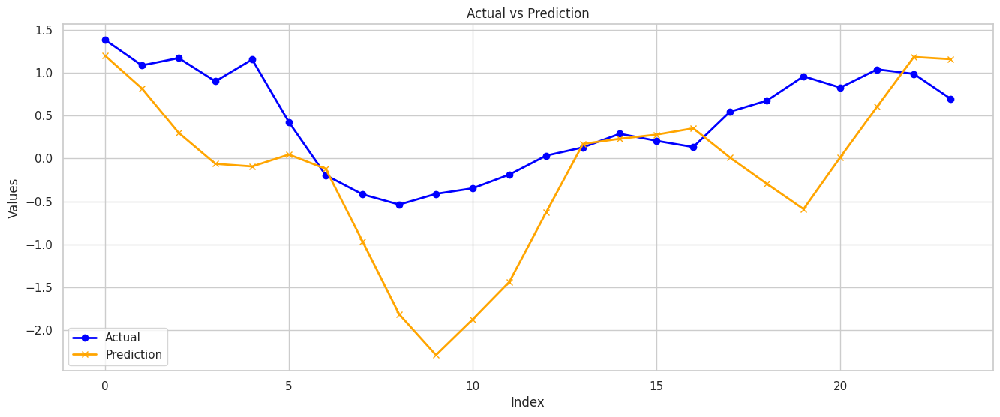

In [ ]:
target_vs_preds_plot(ytrue, preds)

## LSTM approach

As the Linear model used in the previous section does not account for temporal dependence, an LSTM model is introduced here. LSTMs are good at modelling data with temporal dependence. Here LSTMs are trained on three different dataset variations as well (vanilla, rolling_average, pca).


In [ ]:
# LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate, pca = False, rolling_average = False):
        super(LSTMModel, self).__init__()

        self.lstm = nn.LSTM(input_size=input_size,
                            hidden_size=hidden_size,
                            num_layers=num_layers,
                            dropout = dropout_rate,
                            batch_first=True)
        self.pca = pca
        self.linear = nn.Linear(hidden_size, output_size)

        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))

        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def preprocess_features(self, features):
        features = (features.float() - self.features_shift) / self.features_scale
        features = features.permute(0, 1, 4, 2, 3).contiguous()
        return features

    def forward(self, x):
        if self.pca:

          # LSTM forward
          lstm_out, _ = self.lstm(x.float())

          x = self.linear(lstm_out)
          return x

        else:
          x = self.preprocess_features(x)
          b, t, c, h, w = x.shape
          x = x.reshape(b, t, -1)  # Flatten spatial dimensions

          # LSTM forward
          lstm_out, _ = self.lstm(x.float())

          x = self.linear(lstm_out)
          x = x.reshape(b, t, -1)


          return x


    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse





### Vanilla data

In [ ]:
# Model parameters
input_size = 14*14*3
hidden_size = 128
num_layers = 4
output_size = 237
lstm_vanilla = LSTMModel(input_size, hidden_size, num_layers, output_size, dropout_rate = 0.5)
trained_model,preds, ytrue = start_training(lstm_vanilla, 'LSTM',500, vanilla = True)

Model dir:  /content/drive/MyDrive/tensorboard/LSTM/20231201230125
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/LSTM/20231201230125
Running on device cuda
LSTMModel(
  (lstm): LSTM(588, 128, num_layers=4, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=128, out_features=237, bias=True)
)
Number of parameters: 794477


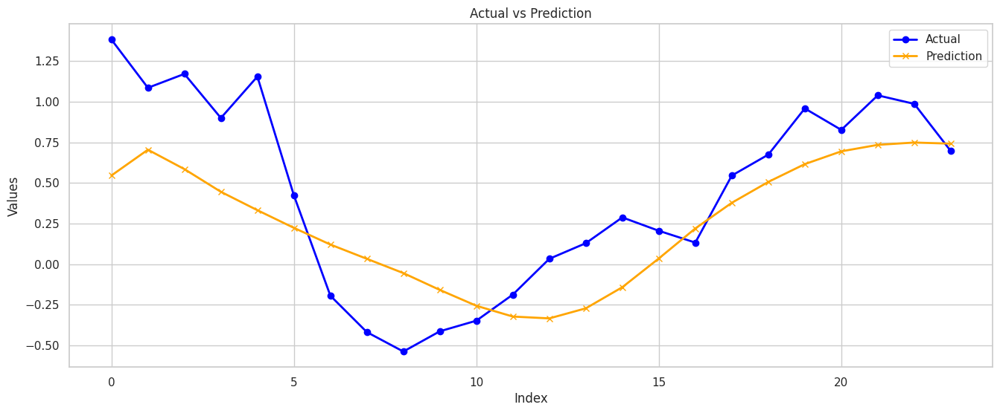

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling average data

In [ ]:
# Model parameters
input_size = 14*14*6
hidden_size = 128
num_layers = 4
output_size = 237
lstm_ma = LSTMModel(input_size, hidden_size, num_layers, output_size, dropout_rate = 0.5, rolling_average = True)
trained_model,preds, ytrue = start_training(lstm_ma, 'LSTM_MA',500, rolling_average = True)

Model dir:  /content/drive/MyDrive/tensorboard/LSTM_MA/20231201230551
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/tensorboard/LSTM_MA/20231201230551
Running on device cuda
LSTMModel(
  (lstm): LSTM(1176, 128, num_layers=4, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=128, out_features=237, bias=True)
)
Number of parameters: 1095533


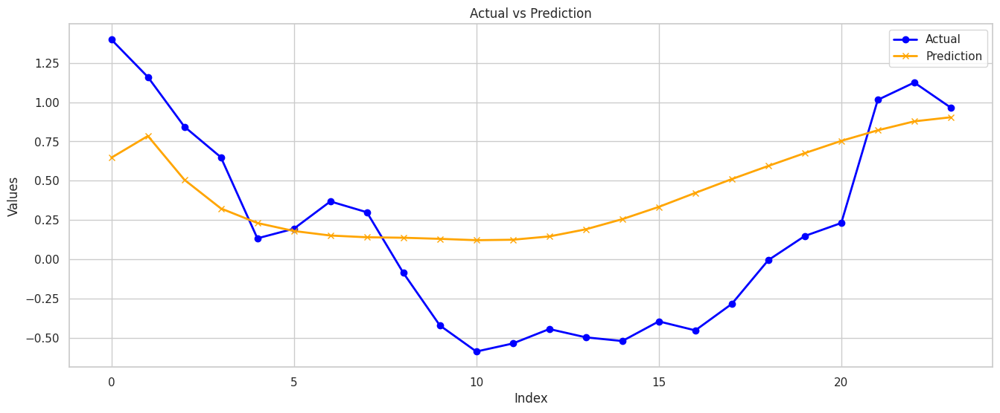

In [ ]:
target_vs_preds_plot(ytrue, preds)

### PCA data

In [ ]:
input_size = 256
hidden_size = 128
num_layers = 4
output_size = 237
lstm_pca_model = LSTMModel(input_size, hidden_size, num_layers, output_size, dropout_rate = 0.5, pca = True)
trained_model,preds, ytrue = start_training(lstm_pca_model, 'LSTM_MA_PCA',500, pca = True, pca_components = 256)

Model dir:  /content/drive/MyDrive/tensorboard/LSTM_MA_PCA/20231201230911
__________________________________________________
features: (833, 24, 256)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 256)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/LSTM_MA_PCA/20231201230911
Running on device cuda
LSTMModel(
  (lstm): LSTM(256, 128, num_layers=4, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=128, out_features=237, bias=True)
)
Number of parameters: 624493


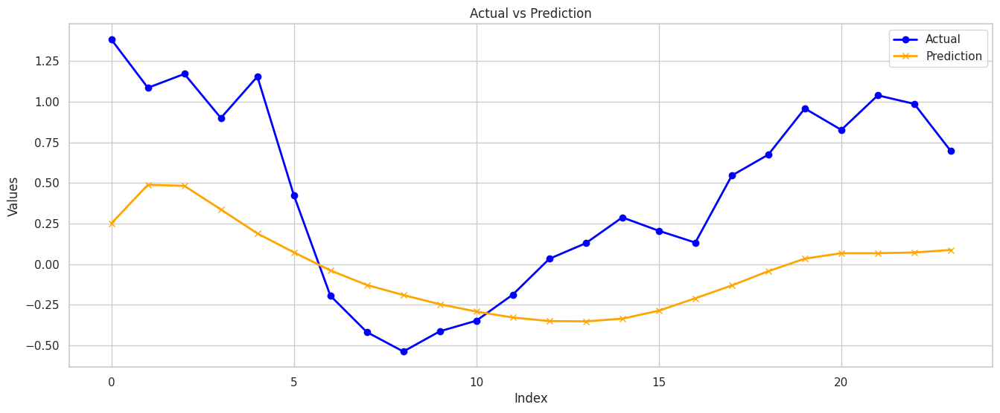

In [ ]:
target_vs_preds_plot(ytrue, preds)

## 3D CNN approach

While LSTMs are good at temporal dependence, our dataset not only has temporal dependence, but it has spatial relations as well. So I wanted to train a model that is capable of modelling both, the temporal and the spatial dependencies, and the 3DCNN was the right starting point for this.


In [ ]:
class CNN3DModel(nn.Module):
    def __init__(self, in_channels, out_dim, rolling_average = False):
        super(CNN3DModel, self).__init__()
        self.conv1 = nn.Conv3d(in_channels, 64, kernel_size=(3, 3, 3), padding=1)
        self.pool = nn.MaxPool3d(kernel_size=(2, 2, 2))
        self.conv2 = nn.Conv3d(64, 128, kernel_size=(3, 3, 3), padding=1)
        self.fc1 = nn.Linear(6912, 512) #4096 overfit
        self.fc2 = nn.Linear(512, out_dim)
        self.relu = nn.ReLU()
        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))
        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def preprocess_features(self, features):
        features = (features.float() - self.features_shift) / self.features_scale
        features = features.permute(0, 4, 1, 2, 3).contiguous()  # NTHWC --> NCTHW
        return features

    def forward(self, features):
        features = self.preprocess_features(features)
        x = self.pool(self.relu(self.conv1(features)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)  # Flatten

        x = self.relu(self.fc1(x))

        x = self.fc2(x)

        return x

    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        pred = pred.view(pred.shape[0],24,237)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse




### Vanilla data

In [ ]:

num_channels = 3
outputdims = 24*237
inter_channels = 128
cnn3d_model = CNN3DModel(num_channels, outputdims)
trained_model, preds, ytrue = start_training(cnn3d_model, "3DCNN", epochs = 250, vanilla = True)



Model dir:  /content/drive/MyDrive/tensorboard/3DCNN/20231201231224
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/3DCNN/20231201231224
Running on device cuda
CNN3DModel(
  (conv1): Conv3d(3, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (pool): MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (fc1): Linear(in_features=6912, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5688, bias=True)
  (relu): ReLU()
)
Number of parameters: 6683960


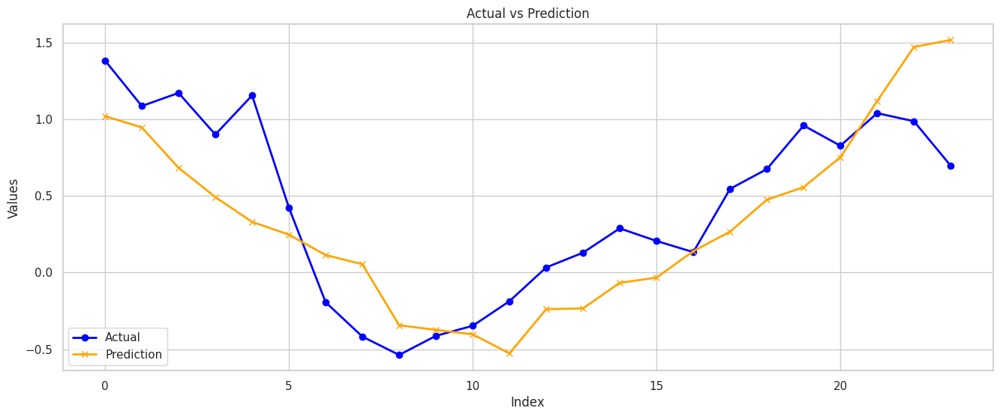

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling Average data

In [ ]:
num_channels = 6
outputdims = 24*237
inter_channels = 128
cnn3d_model = CNN3DModel(num_channels, outputdims, rolling_average = True)
trained_model, preds, ytrue = start_training(cnn3d_model, "3DCNN_MA", epochs = 250, rolling_average = True)

Model dir:  /content/drive/MyDrive/tensorboard/3DCNN_MA/20231201231752
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/tensorboard/3DCNN_MA/20231201231752
Running on device cuda
CNN3DModel(
  (conv1): Conv3d(6, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (pool): MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (fc1): Linear(in_features=6912, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5688, bias=True)
  (relu): ReLU()
)
Number of parameters: 6689144


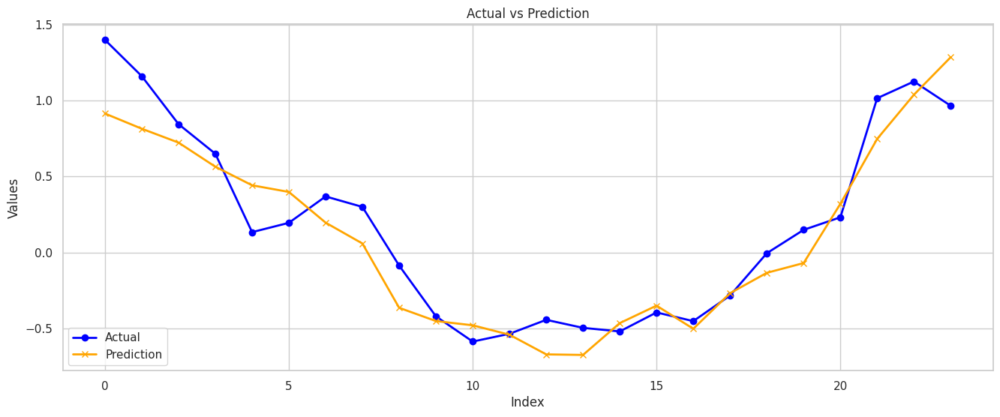

In [ ]:
target_vs_preds_plot(ytrue, preds)

## CNN LSTM approach

We saw in the "LSTM approach" section where the LSTM performed decently well compared to the linear model on our data. But because we were missing out on spatial information, in this section, I first use a 2D CNN to extract spatial features and then use an LSTM to train on top of this. Thus effectively taking into account both the spatial and temporal features.



In [ ]:
class CNNLSTMModel(nn.Module):
    def __init__(self, num_channels,inter_channels, output_size, lstm_hidden_size, lstm_num_layers, lstm_dropout_rate, rolling_average = False, dummy_input_shape = (3,14,14)):
        super(CNNLSTMModel, self).__init__()

        # CNN layers
        self.cnn_layers = nn.Sequential(
            nn.Conv2d(num_channels, inter_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(inter_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Calculate the size of CNN output
        self.cnn_output_size = self._get_cnn_output_size(input_shape=dummy_input_shape)

        self.lstm = nn.LSTM(input_size=self.cnn_output_size,
                            hidden_size=lstm_hidden_size,
                            num_layers=lstm_num_layers,
                            dropout = lstm_dropout_rate,
                            batch_first=True)

        self.linear = nn.Linear(lstm_hidden_size, output_size)
        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))
        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def preprocess_features(self, features):
        features = (features.float() - self.features_shift) / self.features_scale
        features = features.permute(0, 1, 4, 2, 3).contiguous()  # NTHWC --> NCTHW
        return features

    def forward(self, x):

        x = self.preprocess_features(x)
        batch_size, timesteps, C, H, W = x.size()

        # Flatten the spatial dimensions into one feature vector per timestep
        c_in = x.view(batch_size * timesteps, C, H, W)
        c_out = self.cnn_layers(c_in)
        r_in = c_out.view(batch_size, timesteps, -1)


        # LSTM forward
        lstm_out, _ = self.lstm(r_in)


        x = self.linear(lstm_out)


        return x

    def _get_cnn_output_size(self, input_shape):
        dummy_input = torch.zeros(1, *input_shape)
        dummy_output = self.cnn_layers(dummy_input)
        return int(np.prod(dummy_output.size()))

    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse




### Vanilla data

In [ ]:
num_channels = 3
outputdims = 237
inter_channels = 128
lstm_hidden_dims = 256
lstm_dropout_rate = 0.5
lstm_num_layers = 8
cnn_lstm_model = CNNLSTMModel(num_channels,inter_channels, outputdims,lstm_hidden_dims, lstm_num_layers,lstm_dropout_rate)
trained_model,preds, ytrue = start_training(cnn_lstm_model, 'CNN_LSTM',500, vanilla = True)

Model dir:  /content/drive/MyDrive/tensorboard/CNN_LSTM/20231201232502
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/CNN_LSTM/20231201232502
Running on device cuda
CNNLSTMModel(
  (cnn_layers): Sequential(
    (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (lstm): LSTM(576, 256, num_layers=8, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=256, out_features=237, bias=True)
)
Numbe

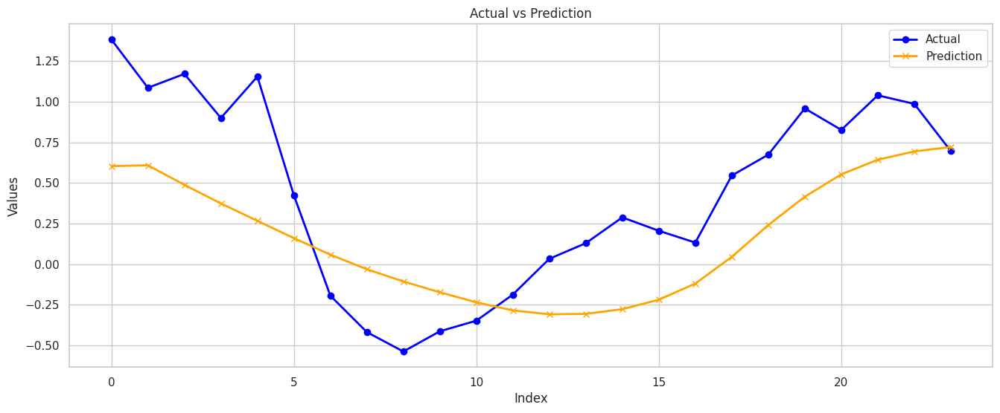

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling average data

In [ ]:
num_channels = 6
outputdims = 237
inter_channels = 128
lstm_hidden_dims = 256
lstm_dropout_rate = 0.5
lstm_num_layers = 8
cnn_lstm_model = CNNLSTMModel(num_channels,inter_channels, outputdims,lstm_hidden_dims, lstm_num_layers,lstm_dropout_rate, rolling_average = True, dummy_input_shape = (6,14,14))
trained_model,preds, ytrue = start_training(cnn_lstm_model, 'CNN_LSTM_MA',300, rolling_average = True)

Model dir:  /content/drive/MyDrive/gridmatic/tensorboard/CNN_LSTM_MA/20231201221722
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/gridmatic/tensorboard/CNN_LSTM_MA/20231201221722
Running on device cuda
CNNLSTMModel(
  (cnn_layers): Sequential(
    (0): Conv2d(6, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (lstm): LSTM(576, 256, num_layers=8, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=256, out_featur

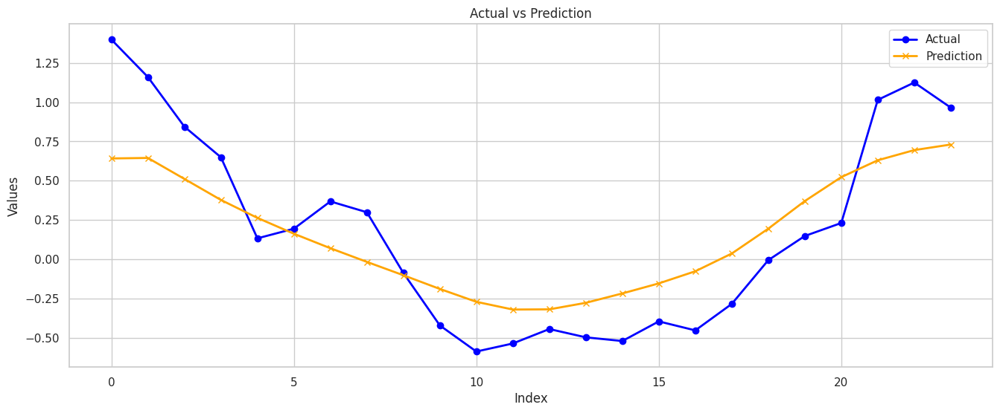

In [ ]:
target_vs_preds_plot(ytrue, preds)

## transformer approach

Another model that is good at learning sequence information are transformers. Here we make use of the transformer-encoder layer to learn sequence representations from our input data and then it is used to predict the final output.

In [ ]:
import math

class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):

        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_heads, num_encoder_layers, num_decoder_layers, dim_feedforward,rolling_average = False):
        super(TransformerModel, self).__init__()

        self.transformer = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=input_dim, nhead=num_heads),
            num_layers=num_encoder_layers
        )
        self.fc = nn.Linear(input_dim, 237)
        self.pos_encoder = PositionalEncoding(d_model=input_dim)

        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))
        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def forward(self, x):

        src = self.preprocess_features(x)
        B,T,C,H,W = src.size()
        src = src.view(B,T,C*H*W)
        src = self.pos_encoder(src)
        transformer_output = self.transformer(src)
        output = self.fc(transformer_output)
        return output



    def preprocess_features(self, features):
        features = (features.float() - self.features_shift) / self.features_scale
        features = features.permute(0, 1, 4, 2, 3).contiguous()  # NTHWC --> NCTHW
        return features



    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse



### Vanilla data

In [ ]:
num_channels = 14 * 14 * 3
num_wind_farms = 237
transformer_model = TransformerModel(input_dim=(14*14*3), num_heads=4, num_encoder_layers=4, num_decoder_layers=4, dim_feedforward=512)
trained_model,preds, ytrue = start_training(transformer_model, 'transformer_2',200,vanilla = True)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Model dir:  /content/drive/MyDrive/tensorboard/transformer_2/20231201233455
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/tensorboard/transformer_2/20231201233455
Running on device cuda
TransformerModel(
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-3): 4 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=588, out_features=588, bias=True)
        )
        (linear1): Linear(in_features=588, out_features=2048, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=2048, out_features=588, bias=True)
        (norm1): LayerNorm((588,), eps=1e-05, elementwise_affine=True)
        (norm

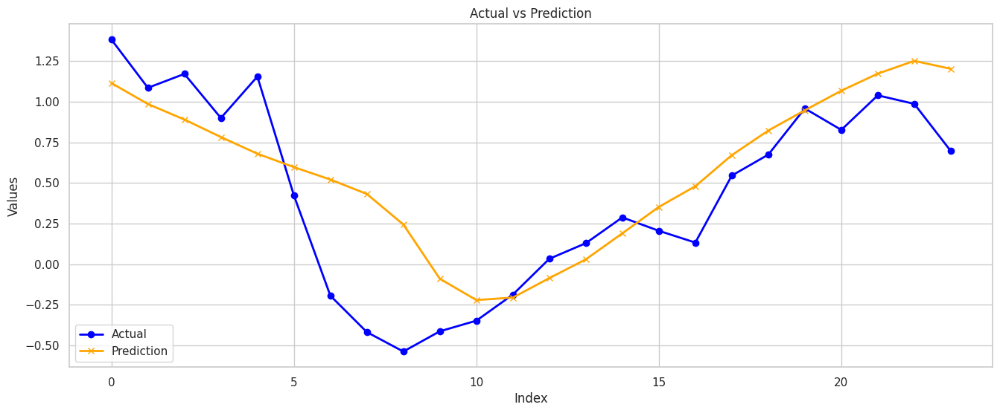

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling average data

In [ ]:
num_channels = 14 * 14 * 6
num_wind_farms = 237
transformer_model = TransformerModel(input_dim= num_channels, num_heads=4, num_encoder_layers=4, num_decoder_layers=4, dim_feedforward=512,rolling_average = True)
trained_model,preds, ytrue = start_training(transformer_model, 'transformer_ma_2',200,rolling_average = True)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Model dir:  /content/drive/MyDrive/gridmatic/tensorboard/transformer_ma_2/20231201214905
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/gridmatic/tensorboard/transformer_ma_2/20231201214905
Running on device cuda
TransformerModel(
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-3): 4 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1176, out_features=1176, bias=True)
        )
        (linear1): Linear(in_features=1176, out_features=2048, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=2048, out_features=1176, bias=True)
        (norm1): LayerNorm((1176,), eps=1e-05, element

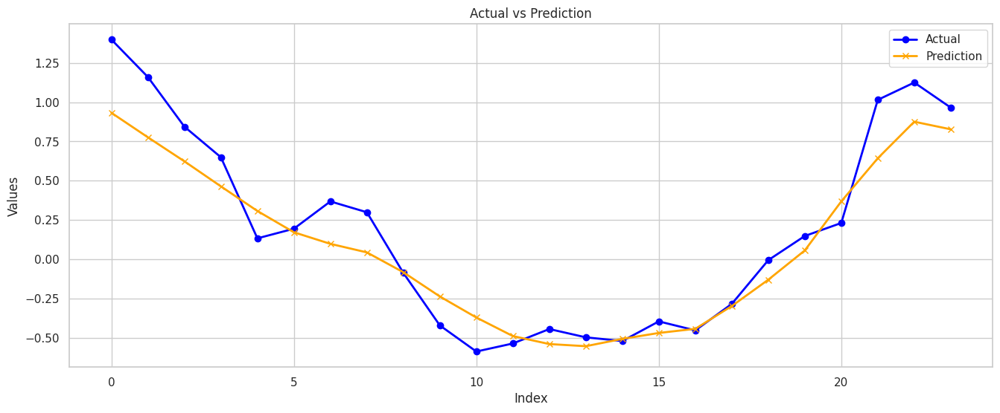

In [ ]:
target_vs_preds_plot(ytrue, preds)

## CNNTransformers

In this section the 2DCNNs are first used to extract spatial features and then the transformer-encoder is used to learn the sequence representations which is then used to predict the final output.

In [ ]:
import math

class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):

        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

class CNNTransformerModel(nn.Module):
    def __init__(self, num_channels, cnn_output_size, transformer_model_dim, num_heads, num_transformer_layers, rolling_average = False):
        super(CNNTransformerModel, self).__init__()
        # CNN for spatial feature extraction
        self.cnn = nn.Sequential(
            nn.Conv2d(num_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Flatten(),
            nn.Linear(128 * ((14 // 4) ** 2), cnn_output_size),
            nn.ReLU()
        )
        # Transformer for sequence processing
        self.pos_encoder = PositionalEncoding(d_model=transformer_model_dim)

        self.transformer = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=transformer_model_dim, nhead=num_heads),
            num_layers=num_transformer_layers
        )
        self.fc = nn.Linear(transformer_model_dim, 237)

        if rolling_average:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT_M_A))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE_M_A))
        else:
          self.register_buffer("features_shift", torch.from_numpy(NAM_SHIFT))
          self.register_buffer("features_scale", torch.from_numpy(NAM_SCALE))

    def forward(self, x):
        x= self.preprocess_features(x)
        batch_size, timesteps, C, H, W = x.size()
        cnn_features = torch.zeros(batch_size, timesteps, 512).to(x.device)
        for t in range(timesteps):
            cnn_features[:, t, :] = self.cnn(x[:, t, :, :, :])

        src = self.pos_encoder(cnn_features)
        transformer_output = self.transformer(src)
        output = self.fc(transformer_output)
        return output


    def preprocess_features(self, features):
            features = (features.float() - self.features_shift) / self.features_scale
            features = features.permute(0, 1, 4, 2, 3).contiguous()
            return features



    def metrics(self):
        return {
            "loss": AverageMetric(),
            "mse": AverageMetric(scale=WIND_POWER_SCALE),
            "mae": AverageMetric(scale=WIND_POWER_SCALE),
        }

    def loss(self, features, targets, weights, metrics=None, return_preds = False):
        """Makes prediction of targets based on features. Returns MSE loss,
        using weights to mask out points that should be ignored (due to windfarm
        not yet being operational or curtailment).

        Arguments:
        features: [b, t, h, w, c]
        targets:  [b, t, n]
        weights:  [b, t, n]

        where
        b: batch_size
        c: input channels
        t: time horizon
        h: spatial feature height
        w: spatial feature width
        n: number of wind farms

        Returns a scalar representing the average loss of the batch
        """
        pred = self(features)
        mse = ((targets - pred).square() * weights).sum() / weights.sum()
        mae = ((targets - pred).abs() * weights).sum() / weights.sum()

        if metrics is not None:
            n = weights.sum().item()
            metrics["loss"].update(mse.item(), n)
            metrics["mse"].update(mse.item(), n)
            metrics["mae"].update(mae.item(), n)

        if return_preds:
          return mse, pred, targets
        else:
          return mse




### Vanilla data

In [ ]:
num_channels = 3
num_wind_farms = 237
cnn_transformer_vanilla = CNNTransformerModel(num_channels=num_channels, cnn_output_size=512, transformer_model_dim=512, num_heads=8, num_transformer_layers=4)
trained_model,preds, ytrue = start_training(cnn_transformer_vanilla, 'CNNtransformer_2',epochs = 250, vanilla = True)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Model dir:  /content/drive/MyDrive/gridmatic/tensorboard/CNNtransformer_2/20231201211739
__________________________________________________
features: (833, 24, 14, 14, 3)
targets: (833, 24, 237)
weights: (833, 24, 237)
__________________________________________________
Data read and preprocessed
data size (833, 24, 14, 14, 3)
Train samples: 667
Val samples: 166
Training /content/drive/MyDrive/gridmatic/tensorboard/CNNtransformer_2/20231201211739
Running on device cuda
CNNTransformerModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=1152, out_features=512, bias=True)
    (8): ReLU()
  )
  (pos_enc

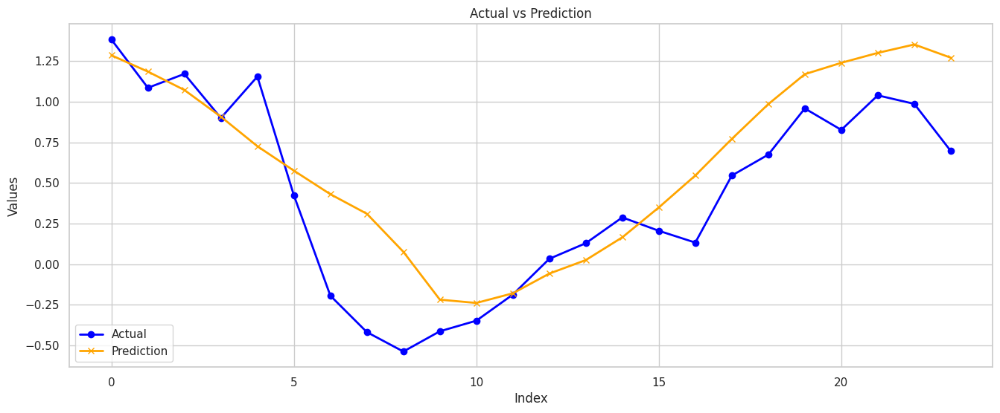

In [ ]:
target_vs_preds_plot(ytrue, preds)

### Rolling average data

In [ ]:
num_channels = 6
num_wind_farms = 237
cnn_transformer_ma = CNNTransformerModel(num_channels=num_channels, cnn_output_size=512, transformer_model_dim=512, num_heads=8, num_transformer_layers=4,rolling_average = True)
trained_model,preds, ytrue = start_training(cnn_transformer_ma, 'CNNtransformer_ma_2',epochs = 200, rolling_average = True)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Model dir:  /content/drive/MyDrive/gridmatic/tensorboard/CNNtransformer_ma_2/20231201212914
__________________________________________________
features: (832, 24, 14, 14, 6)
targets: (832, 24, 237)
weights: (832, 24, 237)
__________________________________________________
Data read and preprocessed
data size (832, 24, 14, 14, 6)
Train samples: 664
Val samples: 168
Training /content/drive/MyDrive/gridmatic/tensorboard/CNNtransformer_ma_2/20231201212914
Running on device cuda
CNNTransformerModel(
  (cnn): Sequential(
    (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=1152, out_features=512, bias=True)
    (8): ReLU()
  )
  (p

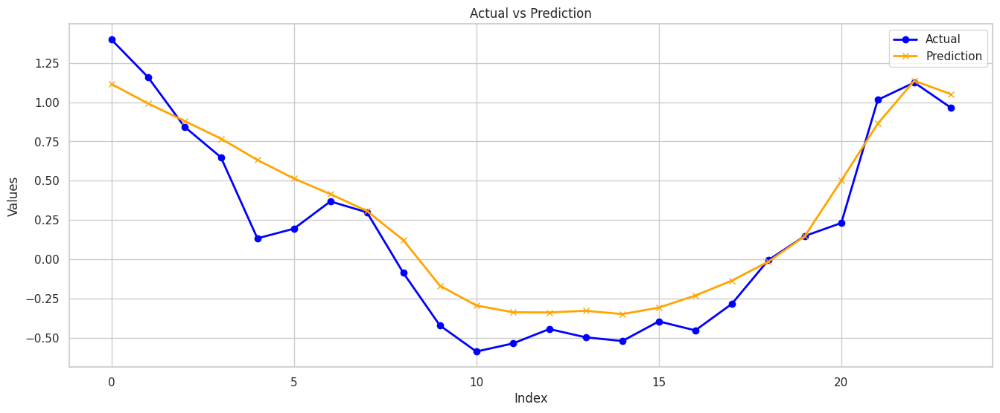

In [ ]:
target_vs_preds_plot(ytrue, preds)

## Final results

Based on the validation loss, the Transformer model trained on vanilla dataset proved to be the best model and the 3DCNN trained on vanilla dataset came close in performance despite having less than half the number of parameters compared to transformer model

In [4]:
%reload_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/tensorboard/"

Reusing TensorBoard on port 6006 (pid 727), started 0:00:07 ago. (Use '!kill 727' to kill it.)

<IPython.core.display.Javascript object>